<a href="https://colab.research.google.com/github/yoyokasharabak-gif/crypto-microtasks-hub/blob/main/tugas_computer_vision_(2).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

IBRAHIM
G.231.23.0134
TUGAS PRATIKUM COMPUTER VISION 2

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Total citra valid: 21


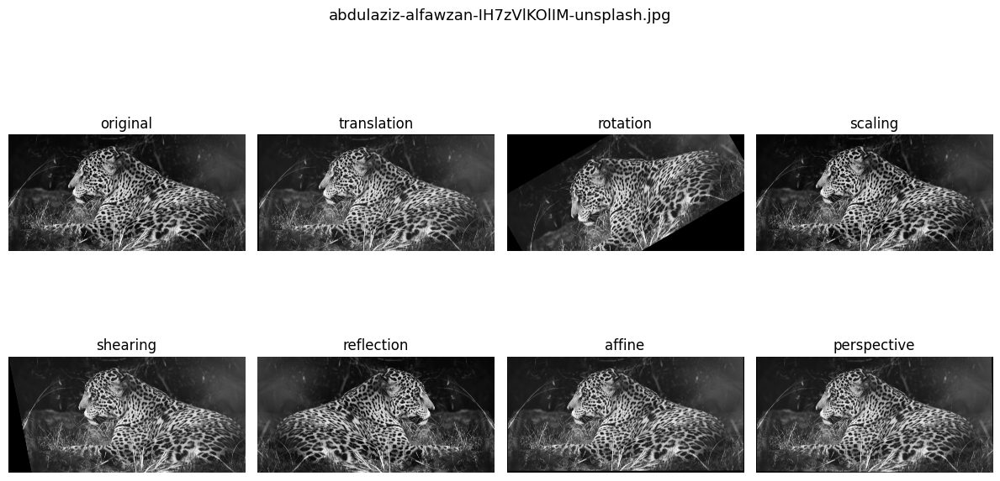

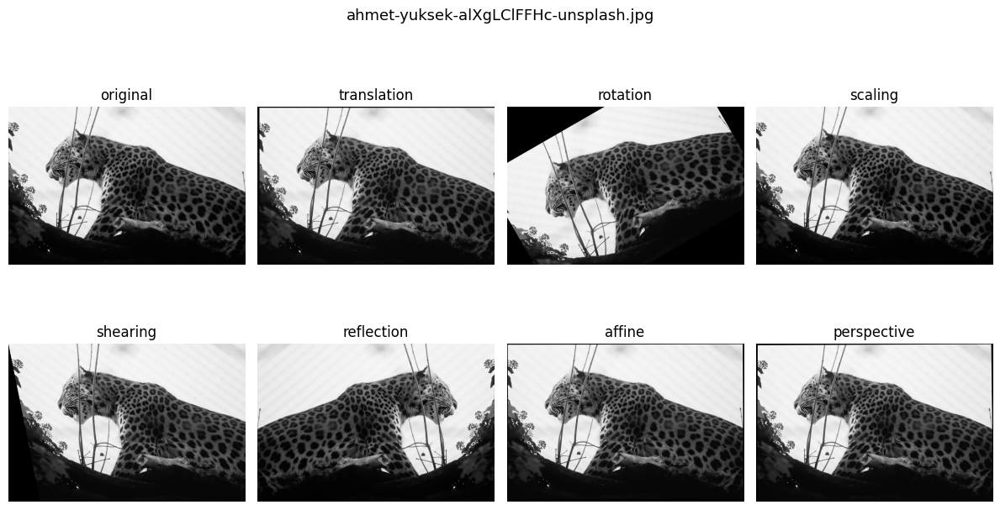

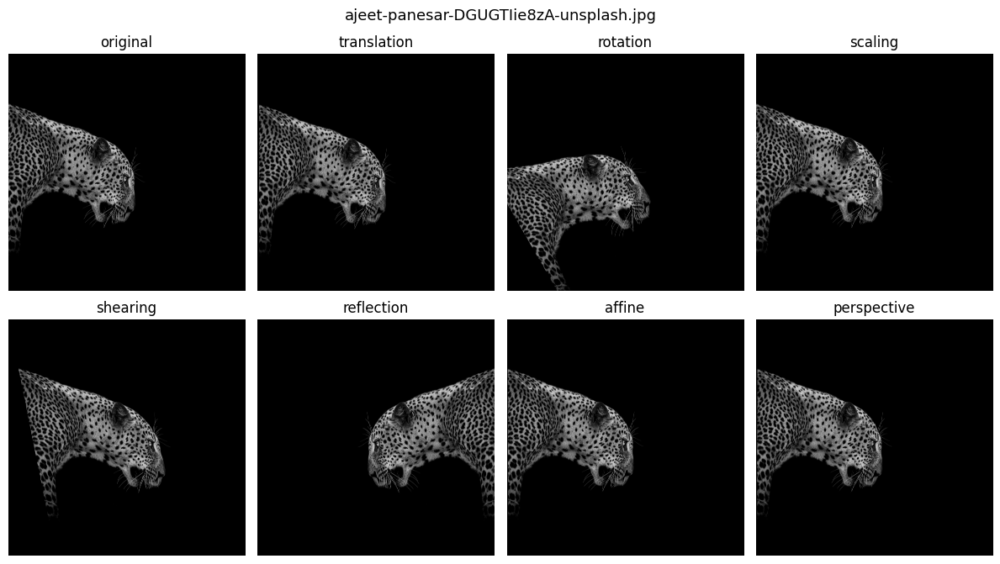

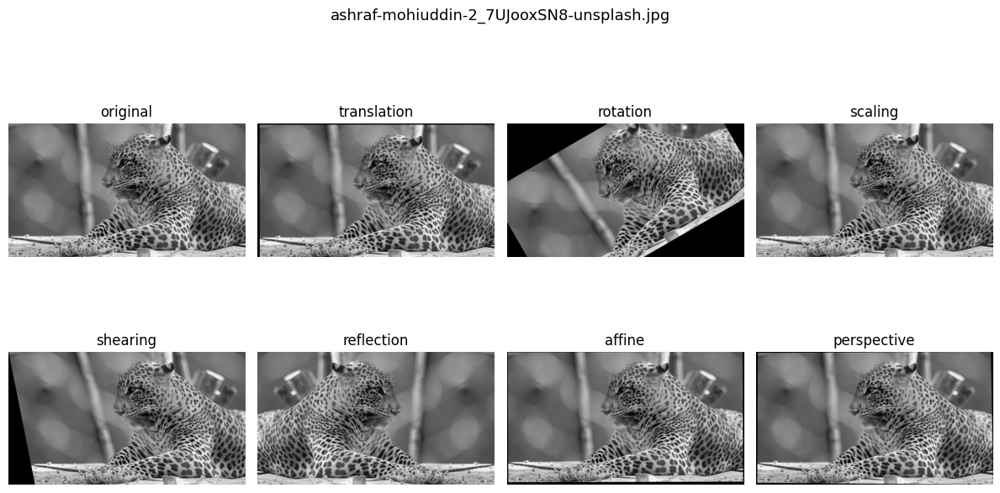

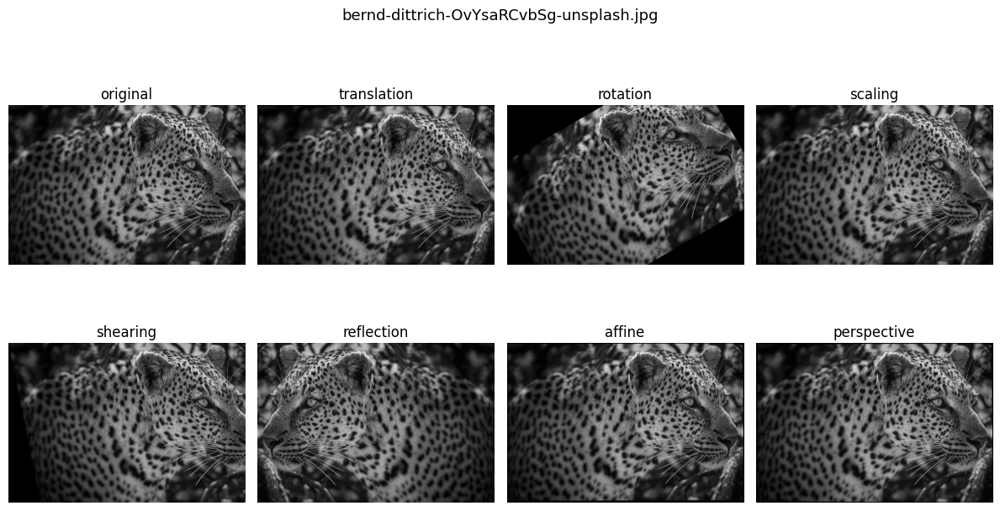

...

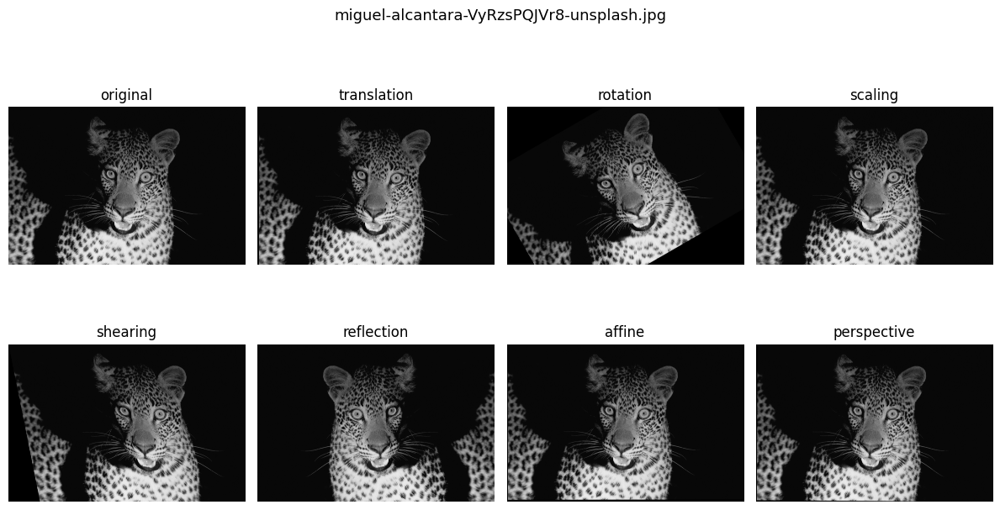

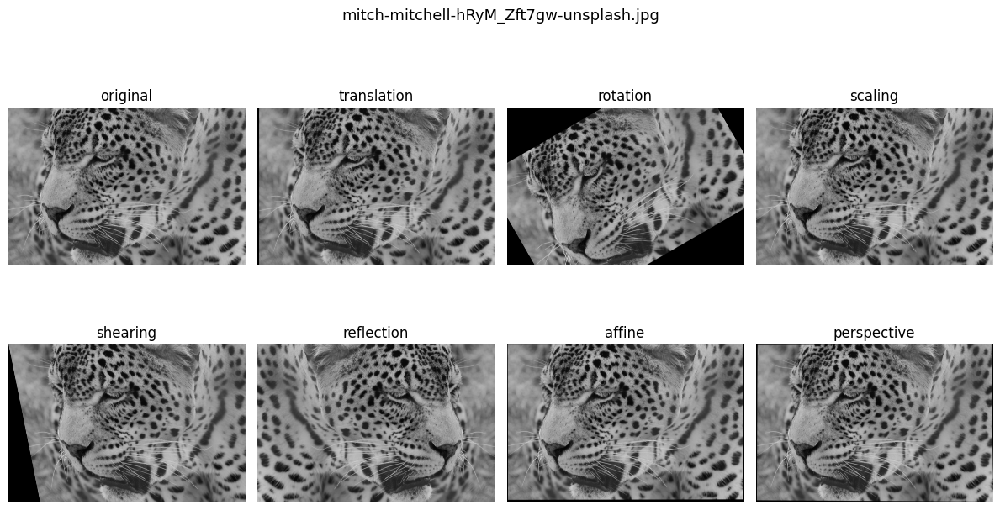

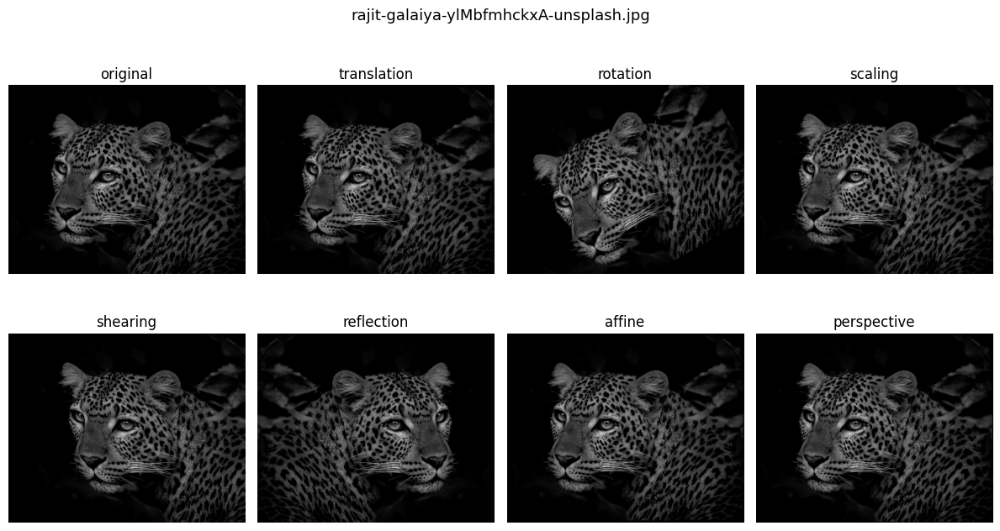

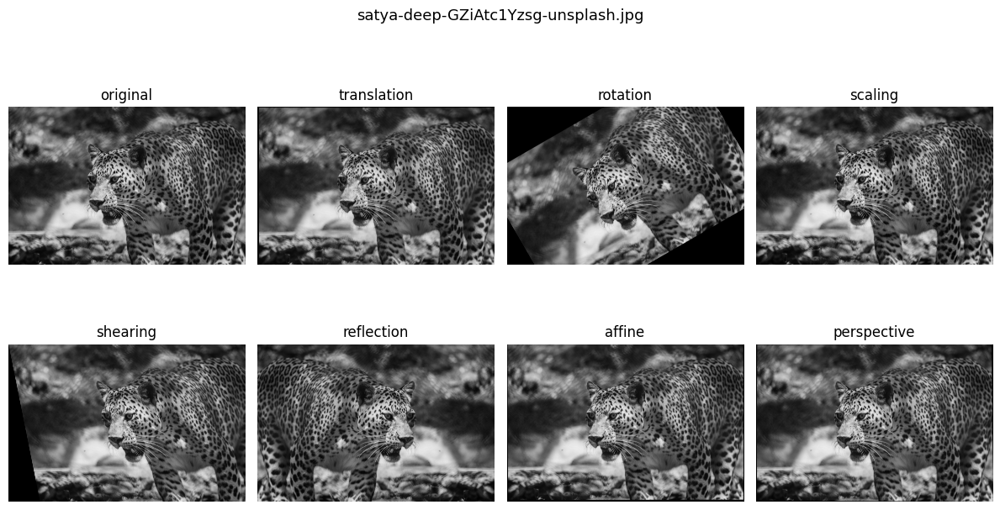

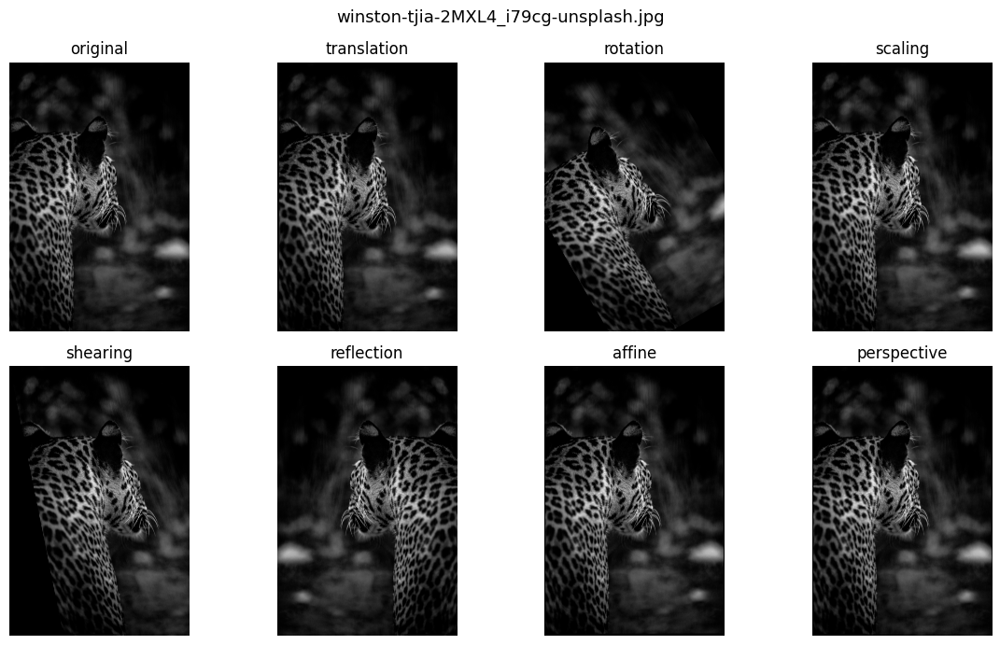

Proses selesai, semua hasil tersimpan.


In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

from google.colab import drive
drive.mount('/content/drive')

DATASET_PATH = "/content/drive/MyDrive/computer_vision"
SAVE_PATH = "/content/drive/MyDrive/computer_vision_result"

os.makedirs(SAVE_PATH, exist_ok=True)


# =========================
# LOAD + PREPROCESS
# =========================
def get_grayscale_images(folder):
    data = []

    for fname in sorted(os.listdir(folder)):
        full_path = os.path.join(folder, fname)

        if not fname.lower().endswith(('.png', '.jpg', '.jpeg')):
            continue

        img = cv2.imread(full_path)
        if img is None:
            continue

        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        data.append((fname, gray))

    print(f"Total citra valid: {len(data)}")
    return data


# =========================
# TRANSFORMASI
# =========================
def shift(img, dx=40, dy=20):
    h, w = img.shape
    T = np.array([[1, 0, dx],
                  [0, 1, dy]], dtype=np.float32)
    return cv2.warpAffine(img, T, (w, h))


def rotate(img, deg=30):
    h, w = img.shape
    center = (w//2, h//2)
    R = cv2.getRotationMatrix2D(center, deg, 1.0)
    return cv2.warpAffine(img, R, (w, h))


def resize_scale(img, scale=1.2):
    h, w = img.shape
    tmp = cv2.resize(img, None, fx=scale, fy=scale)
    return cv2.resize(tmp, (w, h))


def skew(img, kx=0.2):
    h, w = img.shape
    S = np.array([[1, kx, 0],
                  [0, 1, 0]], dtype=np.float32)
    return cv2.warpAffine(img, S, (w, h))


def mirror(img):
    return cv2.flip(img, 1)


def affine_warp(img):
    h, w = img.shape
    src = np.float32([[0,0], [w-1,0], [0,h-1]])
    dst = np.float32([[10,20], [w-30,10], [20,h-40]])
    M = cv2.getAffineTransform(src, dst)
    return cv2.warpAffine(img, M, (w, h))


def perspective_warp(img):
    h, w = img.shape
    src = np.float32([[0,0],[w,0],[0,h],[w,h]])
    dst = np.float32([[30,30],[w-40,10],[20,h-30],[w,h]])
    P = cv2.getPerspectiveTransform(src, dst)
    return cv2.warpPerspective(img, P, (w, h))


# =========================
# PIPELINE TRANSFORMASI
# =========================
TRANSFORM_MAP = {
    "original": lambda x: x,
    "translation": shift,
    "rotation": rotate,
    "scaling": resize_scale,
    "shearing": skew,
    "reflection": mirror,
    "affine": affine_warp,
    "perspective": perspective_warp
}


# =========================
# VISUALISASI
# =========================
def display_results(name, img):
    plt.figure(figsize=(12, 7))
    plt.suptitle(name, fontsize=13)

    for i, (label, func) in enumerate(TRANSFORM_MAP.items()):
        result = func(img)

        plt.subplot(2, 4, i+1)
        plt.imshow(result, cmap='gray')
        plt.title(label)
        plt.axis('off')

    plt.tight_layout()
    plt.show()


# =========================
# SAVE OUTPUT
# =========================
def save_all(name, img):
    base = os.path.splitext(name)[0]

    for label, func in TRANSFORM_MAP.items():
        output = func(img)
        filename = f"{base}_{label}.jpg"
        cv2.imwrite(os.path.join(SAVE_PATH, filename), output)


# =========================
# MAIN EXECUTION
# =========================
dataset = get_grayscale_images(DATASET_PATH)

for fname, img in dataset:
    display_results(fname, img)
    save_all(fname, img)

print("Proses selesai, semua hasil tersimpan.")